In [1]:
import numpy as np
import pandas as pd
import cv2
import matplotlib.pyplot as plt

import glob

import IPython.display as ipd
from tqdm.notebook import tqdm

import subprocess # run commands in the command line

## Convert video types
* mov to mp4

In [5]:
input_file = "../input/driving-video-with-object-tracking/bdd100k_videos_train_00/bdd100k/videos/train/026c7465-309f6d33.mov"
subprocess.run(['ffmpeg',
                '-i',
                input_file,
                '-qscale',
                '0',
                '026c7465-309f6d33.mp4',
                '-loglevel',
                'quiet']
              )

CompletedProcess(args=['ffmpeg', '-i', '../input/driving-video-with-object-tracking/bdd100k_videos_train_00/bdd100k/videos/train/026c7465-309f6d33.mov', '-qscale', '0', '026c7465-309f6d33.mp4', '-loglevel', 'quiet'], returncode=0)

In [6]:
!ls -GFlash --color

total 14M
4.0K drwxr-xr-x 3 root 4.0K May  8 06:24 ./
4.0K drwxr-xr-x 5 root 4.0K May  8 06:16 ../
4.0K drwxr-xr-x 2 root 4.0K May  8 06:16 .virtual_documents/
 14M -rw-r--r-- 1 root  14M May  8 06:25 026c7465-309f6d33.mp4


In [7]:
ipd.Video('026c7465-309f6d33.mp4',width=700)

## Open the video and read the metadata

In [10]:
# load in video capture
cap = cv2.VideoCapture('026c7465-309f6d33.mp4')

In [12]:
# the number of frames
cap.get(cv2.CAP_PROP_FRAME_COUNT)

2398.0

In [16]:
# get some info about the captured video
height = cap.get(cv2.CAP_PROP_FRAME_HEIGHT)
width = cap.get(cv2.CAP_PROP_FRAME_WIDTH)
print(f"Width: {width}, Height: {height}")

Width: 1280.0, Height: 720.0


In [18]:
# Get the fps
fps = cap.get(cv2.CAP_PROP_FPS)
print(f"FPS: {fps:0.2f}")

FPS: 59.94


In [19]:
cap.release()

## Pull images from videos

In [20]:
cap = cv2.VideoCapture('026c7465-309f6d33.mp4')
ret, img = cap.read()
print(f"Returned {ret} and img of shape {img.shape}")

Returned True and img of shape (720, 1280, 3)


In [22]:
# Create a helper function for plotting images in notebook
def display_cv2_img(img, figsize=(10,10)):
    img_ = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    fig, ax = plt.subplots(figsize=figsize)
    ax.imshow(img_)
    ax.axis("off")

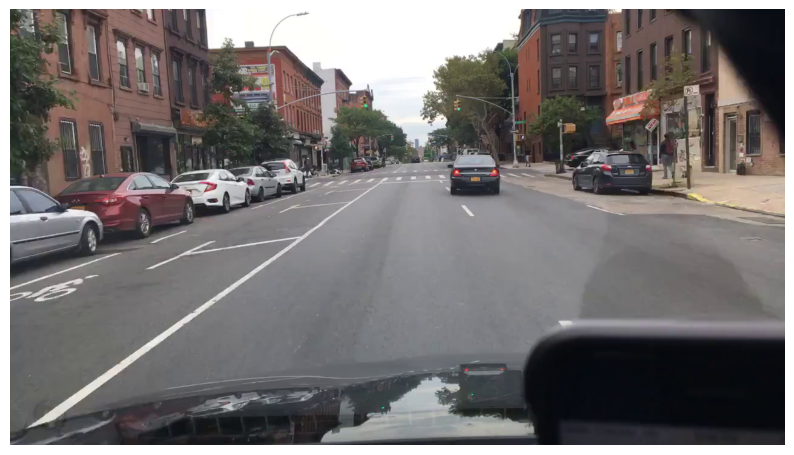

In [23]:
display_cv2_img(img)

In [ ]:
cap.release()

## Display multiple frames from the videos

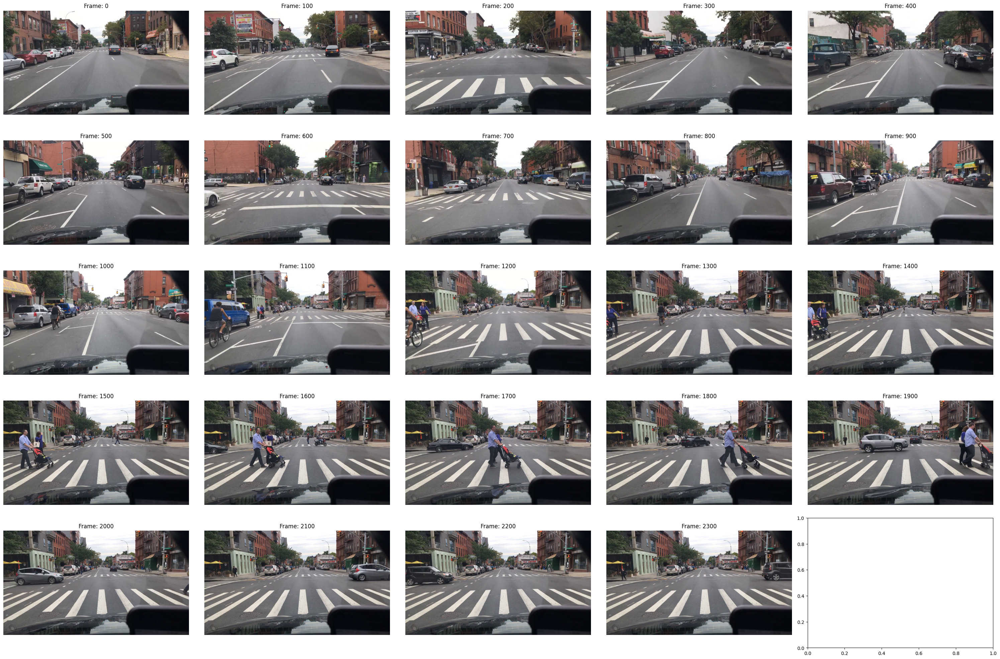

In [28]:
fig, axs = plt.subplots(5, 5, figsize=(30, 20))
axs = axs.flatten()

cap = cv2.VideoCapture('026c7465-309f6d33.mp4')
n_frames = int(cap.get(cv2.CAP_PROP_FRAME_COUNT))

img_idx = 0
for frame in range(n_frames):
    ret, img = cap.read()
    if ret == False:
        break
    if frame % 100 == 0: # (every 100th frame)
        axs[img_idx].imshow(cv2.cvtColor(img, cv2.COLOR_BGR2RGB))
        axs[img_idx].set_title(f"Frame: {frame}")
        axs[img_idx].axis("off")
        img_idx += 1
        
plt.tight_layout()
plt.show()
cap.release()

## Add Annotations to Video Images

In [32]:
labels = pd.read_csv('/kaggle/input/driving-video-with-object-tracking/mot_labels.csv', low_memory=False)
video_labels = (
    labels.query('videoName == "026c7465-309f6d33"').reset_index(drop=True).copy()
) # filter rows from the dataframe that corrispond to this video and put it into a new dataframe
video_labels["video_frame"] = (video_labels["frameIndex"] * 11.9).round().astype("int")

In [44]:
video_labels.head(10)

,name,videoName,frameIndex,id,category,attributes.crowd,attributes.occluded,attributes.truncated,box2d.x1,box2d.x2,box2d.y1,box2d.y2,haveVideo,video_frame
0,026c7465-309f6d33-0000001.jpg,026c7465-309f6d33,0,107627.0,car,False,False,True,0.000000,153.988439,291.329480,423.319571,True,0
1,026c7465-309f6d33-0000001.jpg,026c7465-309f6d33,0,107628.0,car,False,True,False,68.373245,306.193229,269.925681,380.511974,True,0
2,026c7465-309f6d33-0000001.jpg,026c7465-309f6d33,0,107629.0,car,False,True,False,264.574732,398.943022,262.791082,337.704377,True,0
3,026c7465-309f6d33-0000001.jpg,026c7465-309f6d33,0,107630.0,car,False,True,False,359.036452,450.074319,258.390115,317.489678,True,0
4,026c7465-309f6d33-0000001.jpg,026c7465-309f6d33,0,107631.0,car,False,True,False,411.295127,488.715386,246.777076,305.598679,True,0
5,026c7465-309f6d33-0000001.jpg,026c7465-309f6d33,0,107632.0,car,False,False,False,563.038811,593.955409,244.954583,269.925681,True,0
6,026c7465-309f6d33-0000001.jpg,026c7465-309f6d33,0,107633.0,truck,False,True,False,583.253509,601.090008,241.387283,265.169282,True,0
7,026c7465-309f6d33-0000001.jpg,026c7465-309f6d33,0,107634.0,car,False,True,False,592.766309,612.981007,242.576383,263.980182,True,0
8,026c7465-309f6d33-0000001.jpg,026c7465-309f6d33,0,107635.0,car,False,False,False,929.281585,1061.271676,230.685384,307.976879,True,0
9,026c7465-309f6d33-0000001.jpg,026c7465-309f6d33,0,107636.0,pedestrian,False,True,False,1102.890173,1123.104872,204.525186,277.060281,True,0


In [34]:
video_labels["category"].value_counts()

category
car              3030
pedestrian        847
bicycle           381
rider             320
truck             194
other vehicle     115
bus               109
other person       74
motorcycle         67
trailer            34
Name: count, dtype: int64

In [57]:
# Pull frame 1035
cap = cv2.VideoCapture("026c7465-309f6d33.mp4")
n_frames = int(cap.get(cv2.CAP_PROP_FRAME_COUNT))

img_idx = 0
for frame in range(n_frames):
    ret, img = cap.read()
    if ret == False:
        break
    if frame == 1035:
        break
cap.release()

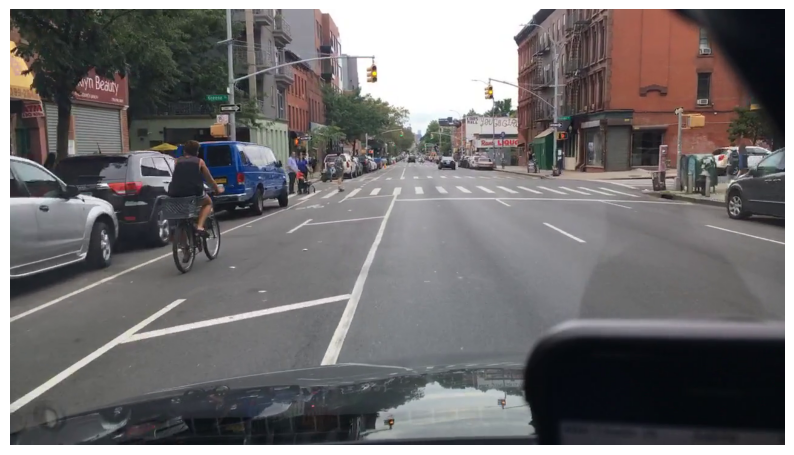

In [58]:
display_cv2_img(img)

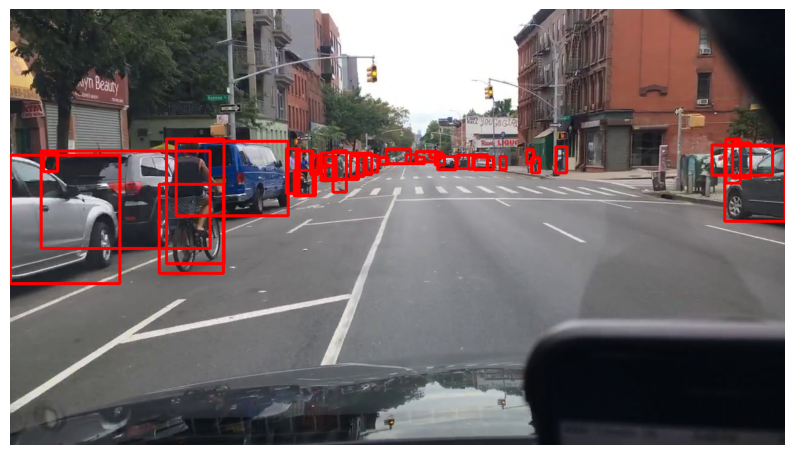

In [59]:
img_example = img.copy()
frame_labels = video_labels.query('video_frame == 1035')
for i, d in frame_labels.iterrows():
    pt1 = int(d['box2d.x1']), int(d['box2d.y1'])
    pt2 = int(d['box2d.x2']), int(d['box2d.y2'])
    cv2.rectangle(img_example, pt1, pt2, (0, 0, 255), 3)

display_cv2_img(img_example)

## Displaying color bbxs by category

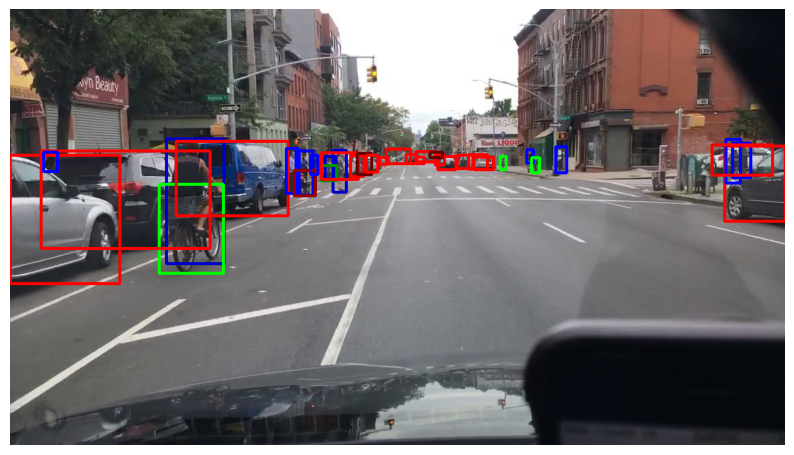

In [60]:
color_map = {
    "car": (0, 0, 255),
    "truck": (0, 0, 100),
    "pedestrian": (255, 0, 0),
    "other vehicle": (0, 0, 150),
    "rider": (200, 0, 0),
    "bicycle": (0, 255, 0),
    "other person": (200, 0, 0),
    "trailer": (0, 150, 150),
    "motorcycle": (0, 150, 0),
    "bus": (0, 0, 100),
}

img_example = img.copy()
frame_labels = video_labels.query('video_frame == 1035')
for i, d in frame_labels.iterrows():
    pt1 = int(d['box2d.x1']), int(d['box2d.y1'])
    pt2 = int(d['box2d.x2']), int(d['box2d.y2'])
    color = color_map[d['category']]
    cv2.rectangle(img_example, pt1, pt2, color, 3)

display_cv2_img(img_example)

## Adding text

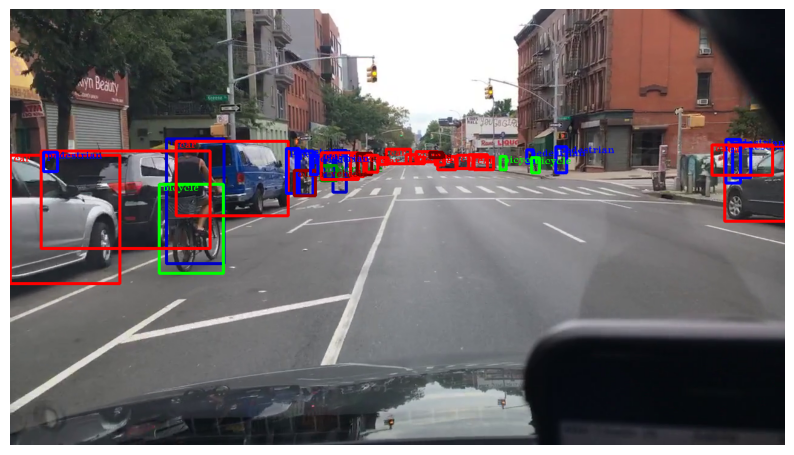

In [61]:
frame_labels = video_labels.query("video_frame == 1035")
font = cv2.FONT_HERSHEY_TRIPLEX

img_example = img.copy()
for i, d in frame_labels.iterrows():
    pt1 = int(d["box2d.x1"]), int(d["box2d.y1"])
    pt2 = int(d["box2d.x2"]), int(d["box2d.y2"])
    color = color_map[d["category"]]
    img_example = cv2.rectangle(img_example, pt1, pt2, color, 3)
    pt_text = int(d["box2d.x1"]) + 5, int(d["box2d.y1"] + 10)
    img_example = cv2.putText(img_example, d["category"], pt_text, font, 0.5, color)
    
display_cv2_img(img_example)
cap.release()

## Label and Output Annotated Video

In [63]:
def add_annotations(img, frame, video_labels):
    max_frame = video_labels.query("video_frame <= @frame")["video_frame"].max()
    frame_labels = video_labels.query("video_frame == @max_frame")
    for i, d in frame_labels.iterrows():
        pt1 = int(d["box2d.x1"]), int(d["box2d.y1"])
        pt2 = int(d["box2d.x2"]), int(d["box2d.y2"])
        color = color_map[d["category"]]
        img = cv2.rectangle(img, pt1, pt2, color, 3)
    return img

In [67]:
!rm -r out_test.mp4

rm: cannot remove 'out_test.mp4': No such file or directory


In [70]:
VIDEO_CODEC = "mp4v"
fps = 59.94
width = 1280
height = 720
out = cv2.VideoWriter("out_test.mp4",
                cv2.VideoWriter_fourcc(*VIDEO_CODEC),
                fps,
                (width, height))

cap = cv2.VideoCapture("026c7465-309f6d33.mp4")
n_frames = int(cap.get(cv2.CAP_PROP_FRAME_COUNT))

for frame in tqdm(range(n_frames), total=n_frames):
    ret, img = cap.read()
    if ret == False:
        break
    img = add_annotations(img, frame, video_labels)
    out.write(img)
out.release()
cap.release()

  0%|          | 0/2398 [00:00<?, ?it/s]

In [71]:
!ls -GFlash -color

total 85M
 72M -rw-r--r-- 1 root  72M May  8 08:45 out_test.mp4
 14M -rw-r--r-- 1 root  14M May  8 06:25 026c7465-309f6d33.mp4
4.0K drwxr-xr-x 2 root 4.0K May  8 06:16 .virtual_documents/
4.0K drwxr-xr-x 5 root 4.0K May  8 06:16 ../
4.0K drwxr-xr-x 3 root 4.0K May  8 08:44 ./


## Convert the labeled output into mp4 and view

In [72]:
tmp_output_path = "out_test.mp4"
output_path = "out_test_compressed.mp4"
subprocess.run(
    [
        "ffmpeg",
        "-i",
        tmp_output_path,
        "-crf",
        "18",
        "-preset",
        "veryfast",
        "-vcodec",
        "libx264",
        output_path,
        '-loglevel',
        'quiet'
    ]
)

CompletedProcess(args=['ffmpeg', '-i', 'out_test.mp4', '-crf', '18', '-preset', 'veryfast', '-vcodec', 'libx264', 'out_test_compressed.mp4', '-loglevel', 'quiet'], returncode=0)

In [73]:
!ls -GFlash --color

total 114M
4.0K drwxr-xr-x 3 root 4.0K May  8 08:46 ./
4.0K drwxr-xr-x 5 root 4.0K May  8 06:16 ../
4.0K drwxr-xr-x 2 root 4.0K May  8 06:16 .virtual_documents/
 14M -rw-r--r-- 1 root  14M May  8 06:25 026c7465-309f6d33.mp4
 72M -rw-r--r-- 1 root  72M May  8 08:45 out_test.mp4
 29M -rw-r--r-- 1 root  29M May  8 08:46 out_test_compressed.mp4


In [74]:
ipd.Video('out_test_compressed.mp4', width=600)